<a href="https://colab.research.google.com/github/bsenst/LoopOfHenle/blob/main/N18Labs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Load & Prepare Data

In [1]:
import pandas as pd
import numpy as np
! pip install simple-icd-10
import simple_icd_10 as icd
import matplotlib.pyplot as plt
import seaborn as sns

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 173 kB 8.6 MB/s 


In [49]:
from matplotlib.pyplot import figure

In [ ]:
# https://colab.research.google.com/drive/1UxZ1M0LNUxjiiImYyzObPmgc7_5DE7OH?usp=sharing

!wget https://owncloud.ikem.cz/index.php/s/mFPJKwbgsOOFBsW/download
!7za x download
# upload demogr (hackath 112022 - Age SEX CKD.xlsx) and demogr2 (hackath 112022 - BMI weight height CKD 1.xlsx)

In [5]:
dtypes = {"Patient":np.int64, "Report":np.int64, "ID":np.int64, "EntryDate":str, "EntryTime":str, "Code":object , "NCLP":str, "Analyte":str, "ValueNumber":str, "ValueText":str, "RefHigh":object, "RefLow":object, "Unit":str}
lab = pd.read_csv("LabsALL 2015-2022.csv", sep=";", dtype=dtypes, parse_dates=["EntryDate", "EntryTime"])

In [8]:
dgs = pd.read_excel("Dg from report.xlsx")
demogr = pd.read_excel("hackath 112022 - Age SEX CKD.xlsx")
demogr2 = pd.read_excel("hackath 112022 - BMI weight height CKD 1.xlsx")

## Label according to N18

In [9]:
dgs_icd = [str(i).split(":")[0] for i in dgs.mainDgCode]
# listing the frequency of diseases
dgs["icd"] = dgs_icd
dgs = dgs[["Patient", "Date", "icd"]]
ckd = [ckd for ckd in dgs["icd"] if "N18" in ckd]
dgs["ckd"] = [1 if "N18" in ckd else 0 for ckd in dgs.icd]

In [11]:
ckd_pdframe = dgs[dgs.ckd==1].drop_duplicates()
ckd_pdseries = ckd_pdframe.icd.value_counts()

In [12]:
ckd_lab_label = []
for p in lab.Patient:
  if p in set(ckd_pdframe.Patient):
    ckd_lab_label.append(1)
  else:
    ckd_lab_label.append(0)
lab["ckd"] = ckd_lab_label
lab[lab["ckd"]==1]

,Patient,Report,ID,EntryDate,EntryTime,Code,NCLP,Analyte,ValueNumber,ValueText,RefHigh,RefLow,Unit,ckd
12076,43841,27069845,151902046,2022-01-12,1899-12-30 07:00:00,IKEM-PLM_0332__R,NaN,B-CrossLaps(mass),NaN,ordinace,NaN,NaN,NaN,1
12077,43841,27069845,151902047,2022-01-12,1899-12-30 07:00:00,IKEM-PLM_0325__R,NaN,P1NP,NaN,ordinace,NaN,NaN,NaN,1
12078,43841,27069845,151902048,2022-01-12,1899-12-30 07:00:00,IKEM-ISS_0017__R,NaN,25(OH)D3,NaN,ordinace,NaN,NaN,NaN,1
12079,43841,27069845,151902049,2022-01-12,1899-12-30 07:00:00,IKEM-ISS_0016__R,NaN,"1,25(OH)D3",NaN,ordinace,NaN,NaN,NaN,1
12080,43841,27069845,151902050,2022-01-12,1899-12-30 07:00:00,IKEM-PLM_0852__R,NaN,TSH,NaN,ordinace,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8637711,68164,27548267,160925962,2022-10-20,1899-12-30 07:00:00,IKEM-OIG_0006__R,NaN,Luminex WL,NaN,odběr,NaN,NaN,NaN,1
8637712,68164,27548267,160925963,2022-10-20,1899-12-30 07:00:00,IKEM-OIG_0009__R,NaN,%PRA,NaN,odběr,NaN,NaN,NaN,1
8637713,68164,27548267,160925964,2022-10-20,1899-12-30 07:00:00,IKEM-OIG_0004__R,NaN,"HLA typizace A,B,DR - příjemce",NaN,odběr,NaN,NaN,NaN,1
8637714,68164,27548267,160925965,2022-10-20,1899-12-30 07:00:00,IKEM-OIG_0031__R,NaN,izolace buněk příjemce,NaN,odběr,NaN,NaN,NaN,1


# N18 subset

In [19]:
ckd_lab = lab[lab.ckd==1]
ckd_lab = ckd_lab[ckd_lab.NCLP.notna()]

In [79]:
lab68164 = ckd_lab[["EntryDate", "NCLP", "ValueNumber"]][(ckd_lab.Patient==68164) & (ckd_lab.ValueNumber.notna())]

In [80]:
lab68164.NCLP.nunique()

177

## frequent lab tests are overwhelming

In [81]:
lab68164_common = lab68164.NCLP.value_counts()
for ix, cn in lab68164_common[:30].items():
  print(ix, cn, end=" ")
  print(*lab.Analyte[lab.NCLP==ix].unique(), sep=" ")

03086 51 s_urea Urea urea S_Urea S-urea
17339 49 CKD-EPI eGF (CKD-EPI) GF CKD-EPI CKD-EPI pro kreatinin Výp.GFR dle CKD-EPI eGFR (CKD-EPI) GF odhad dle CKD EPI Glomerul. filtrace (CKD-EPI) Odhad GF dle CKD-EPI eGFR-CKD-EPI GF dle CKD-EPI
05254 48 s_draslík K S Kalium S_K Draslík Kalium - draslík Kalium S-draslík (K)
08574 48 s_kreatinin kreatinin S-kreatinin
04769 45 B_RDW anizo ERY-CV
12369 45 B_Neutrofily_abs Neutro Neutrofily ap 5P Neutrofily abs. Neutrofily Abs
12365 45 B_Lymfocyty_abs Lymfocyty ap 5P Lymfocyty abs. Lymfocyty Abs
12367 45 B_Monocyty_abs Monocyty ap 5P Monocyty abs. Monocyty Abs
12348 45 B_Eosinofily_abs Eozinofily ap 5P Eozinofily abs. Eozinofily Abs
12347 45 B_Basofily_abs Bazofily ap 5P Bazofily abs. Bazofily Abs
01675 45 B_Erytrocyty Erytrocyty Ery Erytrocyty RBC
01991 45 B_Hemoglobin Hb Hemoglobin Hemoglobin Hb
02099 45 B_Hematokrit Hkt Hematokrit
02419 45 B_MCV MCV Objem ery MCV (střední objem ery)
02688 45 B_Trombocyty Ttrombo Trombocyty Desticky Trombocyty P

## time series

17.3
23.1
22.7
22.6


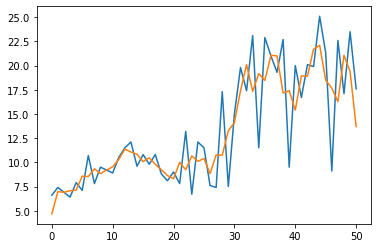

In [130]:
import numpy as np

def running_mean(x, N):
    cumsum = np.cumsum(np.insert(x, 0, 0)) 
    return (cumsum[N:] - cumsum[:-N]) / float(N)

def movingaverage(interval, window_size):
    window= np.ones(int(window_size))/float(window_size)
    return np.convolve(interval, window, 'same')

TimeSEries=y
# TimeSEries=[0.0, 11500312.5, 12293437.5, 11896875.0, 7711186.0, 3281768.863, 3341550.1363, 3300694.0]

MOV = movingaverage(TimeSEries,3).tolist()
STD = np.std(MOV)
events= []
ind = []

for ii in range(len(TimeSEries)):
  try:
    if TimeSEries[ii] > MOV[ii]+STD:
        print(TimeSEries[ii])
  except IndexError:
    pass

plt.plot(range(len(TimeSEries)), TimeSEries)
plt.plot(range(len(TimeSEries)), MOV)

In [139]:
from sklearn import preprocessing

min_max_scaler = preprocessing.MinMaxScaler()
lab68164 = lab68164.sort_values(by="EntryDate")

figure(figsize=(20, 16), dpi=80)

for NCLP in lab68164.NCLP:
  try:
    y = lab68164["ValueNumber"][lab68164.NCLP==NCLP].astype(float)
    v = (y).values
    v = v.reshape(-1, 1)
    y2 = min_max_scaler.fit_transform(v).reshape(1, -1)[0]
    if np.mean(y2) > 0.1:
      y2 = movingaverage(y2,5).tolist()
      plt.plot(lab68164.EntryDate[lab68164.NCLP==NCLP], 
              y2, 
              label=lab.Analyte[lab.NCLP==NCLP].unique())
  except Exception as e:
    print(NCLP, lab.Analyte[lab.NCLP==NCLP].unique(), end=" ", e)

plt.legend(loc='upper left')
plt.show()

03142
02759
02753
05119
05119
02759
02753
03142
16369
05119
16369
05119
16369
16369
19361
16369
01783
02989
03016
16369
11300
11300
03016
02989
01783
16369
16373
16417
16403
19697
14059
14060
16369
03416
12370
14058
13836
14080
16369
16369
16373
16403
16417
01783
16369
16369
16369
16369
19697
03465
03656
03458
19361
03649
16551
16097
03571
15872
16369
15872
03298
03649
03465
16097
03571
16551
03656
03458
16369
02989
14060
14058
01783
11300
19361
52681
14080
03016
03142
16373
16369
03416
13836
12370
14059
14060
13836
14059
12370
14058
14080
03416
16369
19361
16369
52681
52681
16369
16369
16369
16369
03298
16369
52681
03298
16369
16097
03465
16551
15872
03656
03458
03649
03571


In [62]:
print(ckd_lab.NCLP.nunique(), ckd_lab.Analyte.nunique())

763 708


In [143]:
print(lab.Analyte[lab.NCLP=="01176"].unique())
print(lab.Analyte[lab.NCLP=="17339"].unique())
print(lab.Analyte[lab.NCLP=="14225"].unique())

['C1 inhibitor' 'S_C1 inhibitor']
['CKD-EPI' 'eGF (CKD-EPI)' 'GF CKD-EPI' 'CKD-EPI pro kreatinin'
 'Výp.GFR dle CKD-EPI' 'eGFR (CKD-EPI)' 'GF odhad dle CKD EPI'
 'Glomerul. filtrace (CKD-EPI)' 'Odhad GF dle CKD-EPI' 'eGFR-CKD-EPI'
 'GF dle CKD-EPI']
['s_a-gliadin IgG' 'Gliadin IgG']


# Train Model using preselected Features

In [144]:
# https://towardsdatascience.com/building-a-logistic-regression-in-python-step-by-step-becd4d56c9c8

import pandas as pd
import numpy as np
from sklearn import preprocessing
import matplotlib.pyplot as plt 
plt.rc("font", size=14)
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import seaborn as sns
sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)

In [145]:
lab.columns

Index(['Patient', 'Report', 'ID', 'EntryDate', 'EntryTime', 'Code', 'NCLP',
       'Analyte', 'ValueNumber', 'ValueText', 'RefHigh', 'RefLow', 'Unit',
       'ckd'],
      dtype='object')

In [151]:
train_model_df = lab.drop(columns=["Report", "ID", "EntryTime", "Code", "Analyte", "ValueText", "RefHigh", "RefLow", "Unit"])
train_model_df.columns

Index(['Patient', 'EntryDate', 'NCLP', 'ValueNumber', 'ckd'], dtype='object')

In [156]:
train_model_df = train_model_df[train_model_df.NCLP.notna()]
train_model_df.shape

(8105774, 5)

In [157]:
train_model_df = train_model_df[train_model_df.ValueNumber.notna()]
train_model_df.shape

(7027305, 5)

In [ ]:
nclp_features = dict()
features = train_model_df.NCLP.unique()
print("nr of features", len(features))

"""for Patient in train_model_df.Patient.unique()[:1]:
  values = []
  
  for feature in features:
    values.append(list(train_model_df.ValueNumber[train_model_df.NCLP==feature])[0])
  
  nclp_features[Patient] = values"""

In [ ]:
nclp_features = pd.DataFrame.from_dict(nclp_features, orient='index')
nclp_features.head()

In [ ]:
import statsmodels.api as sm

y=train_model_df["ckd"]
X=train_model_df["ValueNumber"]

logit_model=sm.Logit(y,X)

result=logit_model.fit()
print(result.summary2())

## N18 table most common 34 lab tests
provided by Roman

In [170]:
ckd_grouped = pd.read_csv("/content/ckd_grouped.csv")
ckd_grouped.head()

,p_id,EntryDate,8574.0,3086.0,5254.0,2688.0,4769.0,13808.0,1675.0,2419.0,...,12369.0,12365.0,18029.0,18027.0,12449.0,12460.0,12483.0,12478.0,12471.0,543.0
0,10304,2015-02-28,113.3,8.1,3.94,256.0,15.0,5.6,4.31,84.5,...,3.59,1.36,0.4,0.02,0.5,2.8,64.0,8.5,24.2,2.19
1,10304,2015-05-31,112.0,7.9,4.25,223.0,14.2,5.6,4.21,86.0,...,3.66,1.29,0.5,0.03,0.5,3.7,64.9,8.0,22.9,1.96
2,10304,2015-06-30,NaN,NaN,NaN,251.0,14.1,5.1,4.48,83.7,...,3.15,1.29,0.4,0.02,0.6,3.9,61.9,8.3,25.3,NaN
3,10304,2015-11-30,115.7,8.9,3.76,235.0,14.2,5.5,4.22,83.0,...,3.68,1.15,0.2,0.01,0.5,3.7,65.1,10.3,20.4,2.22
4,10304,2016-03-31,NaN,NaN,NaN,246.0,14.9,4.5,4.18,83.7,...,2.83,1.12,0.0,0.00,0.4,4.4,62.7,7.7,24.8,NaN


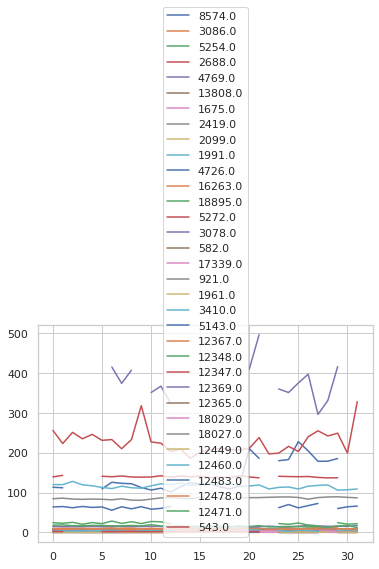

In [180]:
p10304 = ckd_grouped[list(ckd_grouped.columns)[1:]][ckd_grouped.p_id==10304]

plt.plot(p10304.)